In [1]:
import torch
import torch.nn as nn
import pytorch_lightning as pl
import random
from torch.utils.data.dataset import TensorDataset
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
from torchvision.utils import save_image
from torch.optim import Adam
from pytorch_lightning import Trainer
import os
import numpy as np
import pandas as pd
from os.path import join
from typing import Optional
from config import processed_data_path
from sklearn.utils import shuffle
from tqdm.notebook import tqdm
from optuna.integration import PyTorchLightningPruningCallback
from scipy.stats import wasserstein_distance 
import joblib
import optuna
%matplotlib inline
from matplotlib import pyplot as plt
from pytorch_lightning.callbacks import EarlyStopping, ModelCheckpoint
from pytorch_lightning.loggers import TensorBoardLogger
from sklearn.metrics import r2_score
from scipy.stats import wasserstein_distance
import threading
import concurrent

from VAE_OPTIMIZATION_WD import _dataset, VAE, study

[I 2021-07-20 15:20:10,334] Using an existing study with name 'Optimizing the VAE with WD - BKG vs Random Sampling' instead of creating a new one.


## Loading the Study

In [2]:
print("Number of finished trials: {}".format(len(study.trials)))

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

print(" TRIAL NUMBER:", trial.number)

Number of finished trials: 68
Best trial:
  Value: 114.97960542613795
  Params: 
    alpha: 2176
    hidden_size: 38
    lr: 9.794650406548094e-05
    n_layers_decoder: 2
    n_layers_encoder: 4
    n_units_decoder_l0: 395
    n_units_decoder_l1: 115
    n_units_encoder_l0: 100
    n_units_encoder_l1: 80
    n_units_encoder_l2: 450
    n_units_encoder_l3: 170
 TRIAL NUMBER: 53


### Optuna Graphs

In [3]:
optuna.visualization.plot_param_importances(study) 

In [4]:
optuna.visualization.plot_optimization_history(study)

## Anomaly Detection

### Load the model

In [5]:
# Nao é o 49, 53, 33, 26, 25, 23, 22, 16
#name = "wd-sample_vs_data_trial_16"
#name = "wd-sample_vs_data_trial_{}".format(trial.number)
name = "CustomTrain_WD-Data_vs_Sampling_trial_53"
model = VAE.load_from_checkpoint(
    #join('models', f"sample_vs_data_trial_{study.best_trial.number}.ckpt"),
    join("models", name + ".ckpt"),
    #trial = study.trials[16], 
    trial = optuna.trial.FixedTrial(study.best_trial.params), 
    dataset = "bkg", 
    batch_size=512)

model.eval()

/home/acujl/.local/lib/python3.8/site-packages/optuna/distributions.py:560: UserWarning:

The distribution is specified by [1, 10000] and step=5, but the range is not divisible by `step`. It will be replaced by [1, 9996].

/home/acujl/.local/lib/python3.8/site-packages/optuna/distributions.py:560: UserWarning:

The distribution is specified by [5, 500] and step=10, but the range is not divisible by `step`. It will be replaced by [5, 495].



VAE(
  (encoder): Sequential(
    (0): Linear(in_features=69, out_features=100, bias=True)
    (1): LeakyReLU(negative_slope=0.01)
    (2): Linear(in_features=100, out_features=80, bias=True)
    (3): LeakyReLU(negative_slope=0.01)
    (4): Linear(in_features=80, out_features=450, bias=True)
    (5): LeakyReLU(negative_slope=0.01)
    (6): Linear(in_features=450, out_features=170, bias=True)
    (7): LeakyReLU(negative_slope=0.01)
    (8): Linear(in_features=170, out_features=38, bias=True)
  )
  (hidden2mu): Linear(in_features=38, out_features=38, bias=True)
  (hidden2log_var): Linear(in_features=38, out_features=38, bias=True)
  (decoder): Sequential(
    (0): Linear(in_features=38, out_features=395, bias=True)
    (1): LeakyReLU(negative_slope=0.01)
    (2): Linear(in_features=395, out_features=115, bias=True)
    (3): LeakyReLU(negative_slope=0.01)
    (4): Linear(in_features=115, out_features=69, bias=True)
  )
)

### Load data

In [6]:
# Bkg
bkg = _dataset(category='test',variant='bkg').all_data()
bkg_name = bkg['name']
bkg.drop(columns=['weights', 'name'], inplace=True)
bkg.shape

(341121, 69)

## Check if z ~ N(0,1)

In [7]:
_, _, x_out, hidden = model.test_step(torch.from_numpy(bkg.to_numpy(dtype=np.float32)))
x_out = x_out.detach().numpy()
hidden = hidden.detach().numpy()
hidden.shape

(341121, 38)

Mean: -0.47008374 	Std: 0.97000384
Mean: -0.0090650385 	Std: 0.9754584
Mean: 0.18950373 	Std: 0.8966425
Mean: -0.10880751 	Std: 1.1282248
Mean: -0.022589572 	Std: 1.1515371
Mean: -0.037467197 	Std: 0.9653877
Mean: 0.672778 	Std: 1.1230522
Mean: 0.10118399 	Std: 1.2431424
Mean: 0.19538018 	Std: 1.1950392
Mean: -0.13485831 	Std: 1.0105785
Mean: 0.440262 	Std: 1.0918567
Mean: -0.021065028 	Std: 0.9669614
Mean: -0.6483288 	Std: 0.8828235
Mean: -0.60277635 	Std: 0.9710815
Mean: 0.25536487 	Std: 1.025197
Mean: -0.34270006 	Std: 1.0952305
Mean: -0.026204884 	Std: 1.1654502
Mean: -0.062236205 	Std: 0.9638093
Mean: -0.16457213 	Std: 1.084522
Mean: -0.539588 	Std: 1.0108651
Mean: 0.301346 	Std: 1.0396738
Mean: 0.031268556 	Std: 0.9416063
Mean: 0.0023091494 	Std: 0.890707
Mean: 0.050746784 	Std: 1.1622113
Mean: -0.69829684 	Std: 1.0389189
Mean: -0.33537433 	Std: 0.7410275
Mean: 0.54955745 	Std: 1.0100068
Mean: 0.103793345 	Std: 1.0326489
Mean: 0.35784408 	Std: 0.92512804
Mean: -0.09559336 	Std: 0

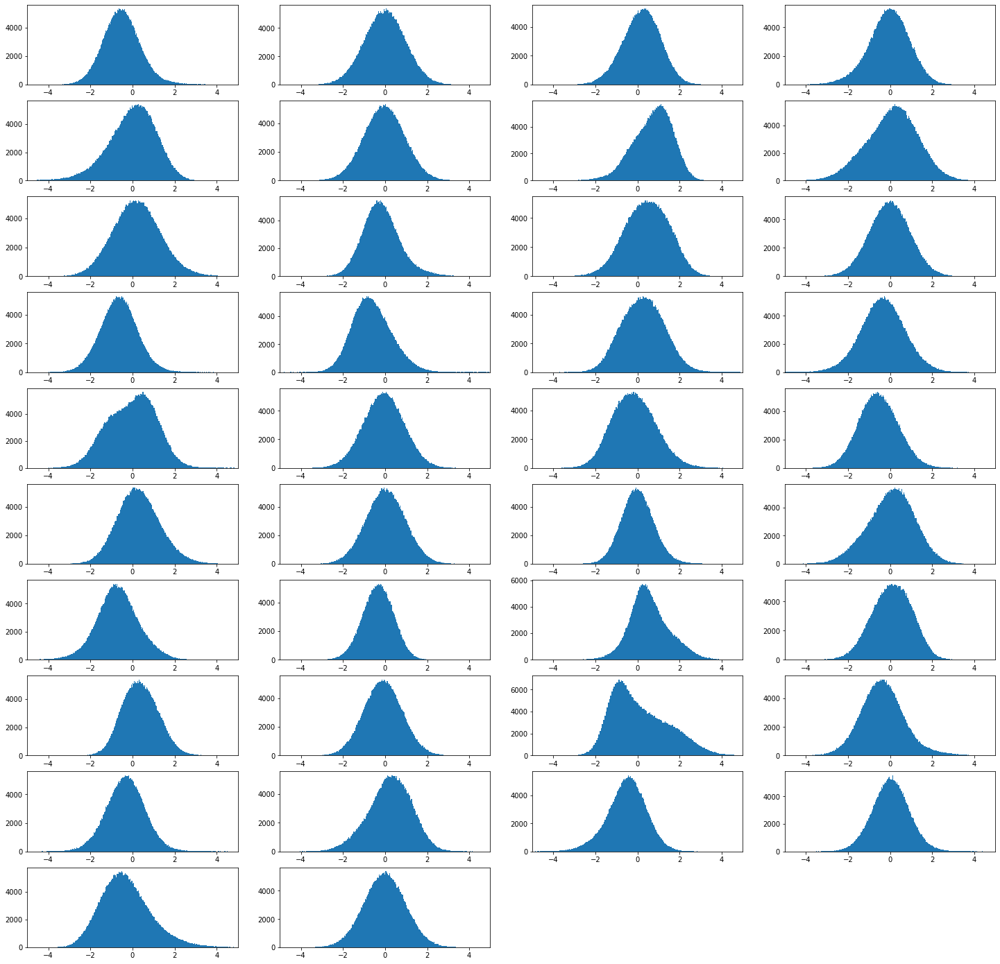

In [8]:

fig = plt.figure(figsize=[25,25])
i = 0

for x in range(hidden.shape[1]):
    axes = fig.add_subplot(10,4,i+1)
    i += 1

    axes.hist(hidden[:, x], bins='auto')
    axes.axis(xmin=-5,xmax=5)
    #axes.title(f"Z{x}")
    print("Mean:", hidden[:, x].mean(), "\tStd:", hidden[:, x].std())


fig.show()

## Bkg Data vs Random Sampling Decoding

In [9]:
# Random sample from N(0,1)
sample = model.decode(torch.rand(bkg.shape[0], study.best_trial.params['hidden_size'])).detach().numpy()

# Make it a dataframe
sample = pd.DataFrame(sample, columns=bkg.columns)
sample.describe()

,Electron1_Eta,Electron1_PT,Electron1_Phi,Electron2_Eta,Electron2_PT,Electron2_Phi,Electron_Multi,FatJet1_Eta,FatJet1_Mass,FatJet1_PT,...,MissingET_MET,MissingET_Phi,Muon1_Eta,Muon1_PT,Muon1_Phi,Muon2_Eta,Muon2_PT,Muon2_Phi,Muon_Multi,ScalarHT_HT
count,341121.000000,341121.000000,341121.000000,341121.000000,341121.000000,341121.000000,341121.000000,341121.000000,341121.000000,341121.000000,...,341121.000000,341121.000000,341121.000000,341121.000000,341121.000000,341121.000000,341121.000000,341121.000000,341121.000000,341121.000000
mean,-0.071208,-0.306930,0.075189,-0.040169,-0.640392,0.047958,-0.447021,0.206809,-1.110041,-0.912470,...,-1.327666,-1.040140,-1.402929,-0.007396,-1.089889,-0.431793,-0.533809,-0.232614,0.436067,-0.952475
std,0.187889,0.230387,0.137249,0.172210,0.066191,0.136904,0.239474,0.223028,0.209420,0.155804,...,0.296484,0.468737,0.335836,0.183478,0.280572,0.293497,0.199829,0.323704,0.228460,0.158382
min,-1.241422,-1.131006,-0.779802,-1.467876,-1.008818,-1.102396,-0.824501,-0.865061,-1.973359,-1.521312,...,-2.396600,-2.641414,-2.727738,-0.683620,-2.217731,-1.723025,-1.056758,-1.683871,-0.611402,-1.601584
25%,-0.141027,-0.486345,-0.013324,-0.103129,-0.685111,-0.016468,-0.656019,0.057832,-1.254733,-1.018090,...,-1.534466,-1.382223,-1.635638,-0.135580,-1.280838,-0.629618,-0.679581,-0.450537,0.289356,-1.060265
50%,-0.026313,-0.326462,0.050061,-0.012944,-0.636421,0.067364,-0.490434,0.209450,-1.116379,-0.909089,...,-1.331743,-1.069146,-1.412013,-0.020886,-1.095237,-0.411642,-0.569042,-0.215504,0.482922,-0.945343
75%,0.040119,-0.149497,0.136810,0.061738,-0.592628,0.135300,-0.286635,0.358211,-0.971618,-0.805289,...,-1.126696,-0.714595,-1.179820,0.106746,-0.905415,-0.217013,-0.420854,-0.023361,0.628753,-0.838736
max,0.954266,0.740726,1.375062,0.606853,-0.350548,0.532878,0.629808,1.333067,-0.162140,-0.267970,...,0.014710,0.660876,0.093849,1.009841,0.453477,0.748789,0.706631,1.584799,0.878691,-0.365120


In [10]:
def plot_graphs2(background, signal, bins=50, num_cols=4, first_name="Signal", second_name="Sampled"):
    WD_SCORE = 0
    R2_SCORE = 0
    # Ignoring irrelevant features such as 'name' and 'weights' in
    # the plotting of the data
    features  = list(background.columns)
    for x in ['name', 'weights']: 
        try:
            features.remove(x)
        except:
            pass

    # Plot creation
    num_rows = int(np.ceil((len(list(background.columns)) - 1) / num_cols)) +1
    fig, ax = plt.subplots(num_rows, num_cols, figsize=(40, 60))
    i= 0

    for x in tqdm(features, total=len(features), desc="Processing..."):

        # Plot  
        row, col = int(i/num_cols), i%num_cols
        #print(row, col, i)
        i += 1


        # Define histogram range
        hist_min = min(signal[x].min(), background[x].min())
        hist_max = max(signal[x].max(), background[x].max())
        hist_range = (hist_min, hist_max)


        ax[row, col].set_title(x)
        ax[row, col].set_yscale('log')
        
        ax[row, col].hist(background[x], bins=bins, alpha=0.5, label=first_name, range=hist_range)
        ax[row, col].hist(signal[x], bins=bins, alpha=0.5, label=second_name,  range=hist_range)
        
        ax[row, col].autoscale(enable=True) 
        ax[row, col].legend()

        WD_SCORE += wasserstein_distance(background[x], signal[x])
        R2_SCORE += r2_score(background[x],signal[x])
        

    fig.tight_layout()
    #plt.savefig('1_explore_data.png', bbox_inches='tight', dpi=100)
    plt.show()
    print("WD_SCORE:", WD_SCORE/len(features))
    print("R2_SCORE:", R2_SCORE/len(features))

Processing...:   0%|          | 0/69 [00:00<?, ?it/s]

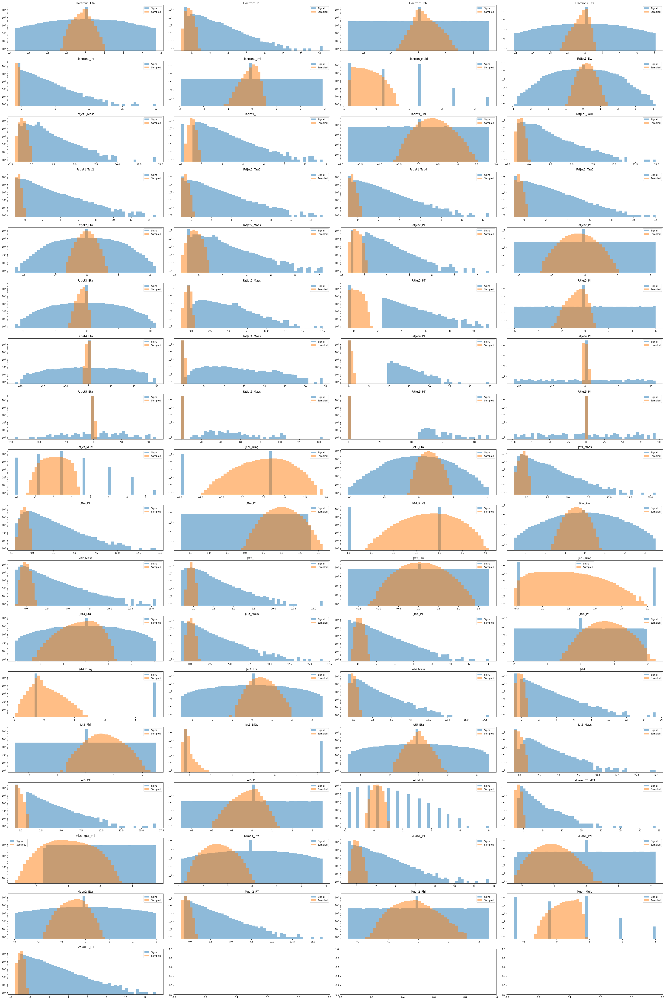

WD_SCORE: 0.6177723740351044
R2_SCORE: -0.3490597194024167


In [11]:
plot_graphs2(bkg, sample)

## Bkg Data vs Reconstruction

In [12]:
def plot_graphs3(first, second, first_name="Signal", second_name="Sampled", bins=50, num_cols=4, num_features=69):

    R2_SCORE = 0

    # Reshape
    first = first.reshape(num_features, -1)
    second = second.reshape(num_features, -1)

    # Plot creation
    num_rows = int(np.ceil((num_features - 1) / num_cols)) +1
    fig, ax = plt.subplots(num_rows, num_cols, figsize=(40, 60))
    i= 0

    for x in tqdm(range(num_features), total=num_features, desc="Processing..."):

        # Plot  
        row, col = int(i/num_cols), i%num_cols
        #print(row, col, i)
        i += 1


        # Define histogram range
        hist_min = min(first[x].min(), second[x].min())
        hist_max = max(first[x].max(), second[x].max())
        hist_range = (hist_min, hist_max)


        ax[row, col].set_title(x)
        ax[row, col].set_yscale('log')
        
        ax[row, col].hist(first[x], bins=bins, alpha=0.5, label=first_name, range=hist_range)
        ax[row, col].hist(second[x], bins=bins, alpha=0.5, label=second_name,  range=hist_range)

        x = x.cpu().numpy()
        output = output.cpu().numpy()

        #print("Input", np.isnan(x).any())
        #print("Output", np.isnan(output).any())


        R2_SCORE += r2_score(first[x],second[x])
        

    fig.tight_layout()
    #plt.savefig('1_explore_data.png', bbox_inches='tight', dpi=100)
    plt.show()
    print("R2_SCORE:", R2_SCORE/num_features)

Processing...:   0%|          | 0/69 [00:00<?, ?it/s]

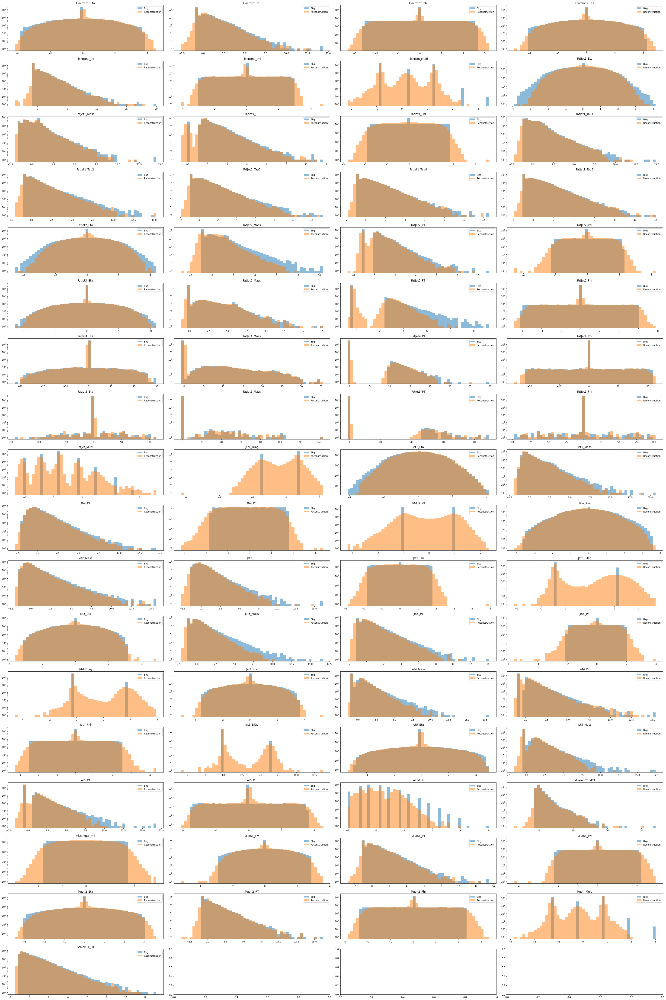

WD_SCORE: 0.08096027004387239
R2_SCORE: 0.9275715628377111


In [13]:
plot_graphs2(bkg, pd.DataFrame(x_out, columns=bkg.columns), first_name="Bkg", second_name="Reconstruction")

## Plot error distributions and ROC Scores

Load data

In [14]:
bkg = _dataset(category='test',variant='bkg').all_data()
signal = _dataset(category='all',variant='signal').all_data()
# signal.drop(columns=['weights'], inplace=True)
signal['name'].unique()

array(['hg3000_hq1000.h5', 'wohg_hq1000.h5', 'hg3000_hq1200.h5',
       'wohg_hq1200.h5', 'fcnc.h5', 'hg3000_hq1400.h5', 'wohg_hq1400.h5'],
      dtype=object)

Plot

In [15]:
from sklearn.metrics import roc_auc_score, roc_curve
def plot_graphs3(data, bins=50, num_cols=4):

    # Plot creation
    features = list(data['name'].unique())

    #num_rows = int(np.ceil((len(list(features)) - 1) / num_cols)) +1
    #fig, ax = plt.subplots(num_rows, num_cols, figsize=(40, 60))
    #i= 0


    distributions = {}

    for x in tqdm(features, total=len(features), desc="Processing..."):

        # Plot  
        #row, col = int(i/num_cols), i%num_cols
        #print(row, col, i)
        #i += 1

        # Input to the model
        sData = data.loc[data['name'] == x].drop(columns=['name', 'weights'])#[:100000]
        sData = torch.from_numpy(
            sData.to_numpy(dtype=np.float32)
        )

        # Pass input through model
        _, _, output, _ = model.test_step(sData)

        # Calculate the error dist
        error_dist = (sData - output)**2
        del output, sData
        error_dist = error_dist.detach().numpy().sum(axis=1)
        error_dist = np.log(error_dist)
        # Append to list
        distributions[x] = error_dist

    # Now we are going to find the maximum of all distributions
    max_of_dist = max(map(lambda x: max(x), distributions.values()))

    # Normalize the distributions
    # This way all values should be between 0 and one
    for x in distributions:
        distributions[x] = distributions[x] / max_of_dist
    # distributions =list(map(lambda x: x/max_of_dist, distributions))


    fig, ax = plt.subplots( figsize=(10,10))
    ax.set_yscale('log')

    

    for x in tqdm(distributions.keys(), desc="Processing..."):

        hist_range = (0, 1)        

        #x = x.replace(".h5", "")
        if x != 'bkg.h5':
            ax.hist(distributions[x], bins=bins, alpha=0.9, label=x.replace(".h5", ""), range=hist_range, histtype=u'step', linewidth=2)
        else:
            ax.hist(distributions[x], bins=bins, alpha=0.2, label=x.replace(".h5", ""), range=hist_range)

        # Plot rocs
        # ax[row, col].hist(signal[x], bins=bins, alpha=0.5, label=second_name,  range=hist_range)
        
    ax.autoscale(enable=True) 
    ax.set_title("Error Dist.")
    ax.legend()


    # PLOT ROC
    fig_roc, ax_roc = plt.subplots(figsize=(10,10))
    for x in tqdm(distributions.keys(), desc="Processing..."):
        if x != 'bkg.h5':
            # Set labels
            bkg_labels = np.zeros(distributions['bkg.h5'].shape[0]).astype(int)
            signal_labels = np.ones(distributions[x].shape[0]).astype(int)
            labels = np.concatenate([bkg_labels, signal_labels])

            weights = pd.concat([
                                data[data['name'] == "bkg.h5"]['weights'], 
                                data[data['name'] == x]['weights']
                                ])

            score = np.concatenate([distributions['bkg.h5'], distributions[x]]) 
            score = score / max_of_dist

            #print(labels.shape, weights.shape, score.shape, x)
            fpr, tpr, thr = roc_curve(
                    y_true=labels, 
                    y_score=score,
                    #sample_weight=weights
                    )
            
            
            ax_roc.plot(fpr, tpr, label=x.replace('.h5', ''))
            ax_roc.plot([0,1],[0,1], 'k--')
   
            print(f"ROC SCORE for {x.replace('.h5', '')}:", 
                    roc_auc_score(y_true=labels, 
                    y_score=score,
                    sample_weight=weights))

    fig_roc.show()
    ax_roc.set_title(f"BKG vs Signals")
    ax_roc.legend()
                

    fig.tight_layout()
    plt.show()

In [16]:
data = pd.concat([signal, bkg])
del signal, bkg

Processing...:   0%|          | 0/8 [00:00<?, ?it/s]

Processing...:   0%|          | 0/8 [00:00<?, ?it/s]

Processing...:   0%|          | 0/8 [00:00<?, ?it/s]

ROC SCORE for hg3000_hq1000: 0.995744842523894
ROC SCORE for wohg_hq1000: 0.9958876543058828
ROC SCORE for hg3000_hq1200: 0.9961230741289606
ROC SCORE for wohg_hq1200: 0.9962725566311941
ROC SCORE for fcnc: 0.7160353477545565
ROC SCORE for hg3000_hq1400: 0.9961633201080604
ROC SCORE for wohg_hq1400: 0.9963803951608626
<ipython-input-15-4c67cb32d9e5>:104: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



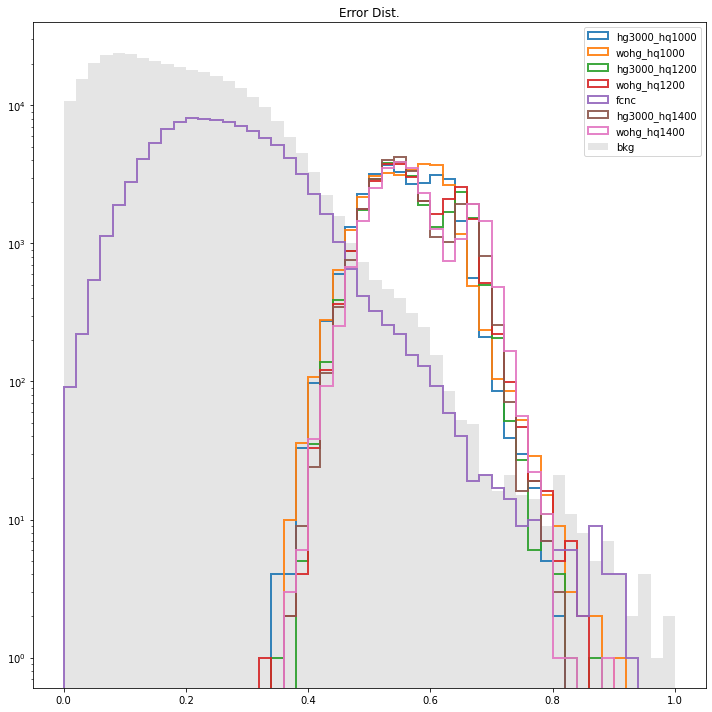

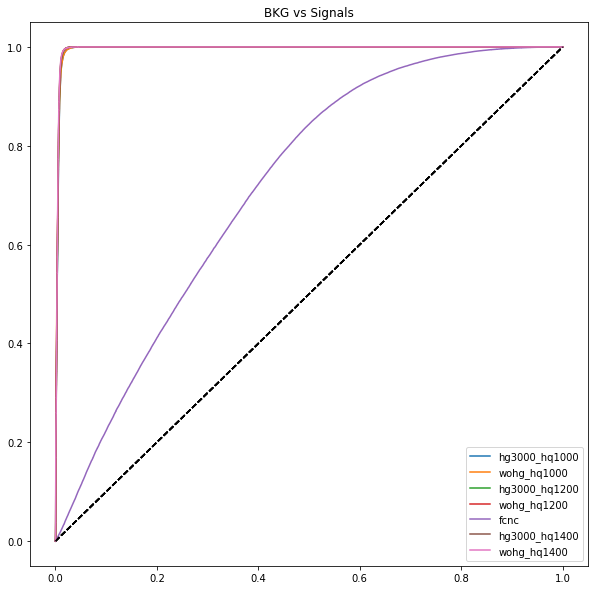

In [17]:
plot_graphs3(data)